In [73]:
from datasets import load_dataset

# train_dataset = load_dataset("Multimodal-Fatima/VQAv2_sample_train", split="train")
# val_dataset = load_dataset("Multimodal-Fatima/VQAv2_sample_validation", split="validation")
train_dataset = load_dataset("HuggingFaceM4/VQAv2", split="train")
val_dataset = load_dataset("HuggingFaceM4/VQAv2", split="validation")

Found cached dataset vq_av2 (/.local/share/HuggingFaceM4___vq_av2/default/1.0.0/e4d008385143be7a6bd81e99483e671d5096942bcb987542217121a5ac2cb420)
Found cached dataset vq_av2 (/.local/share/HuggingFaceM4___vq_av2/default/1.0.0/e4d008385143be7a6bd81e99483e671d5096942bcb987542217121a5ac2cb420)


In [74]:
train_dataset[0]

{'question_type': 'what is this',
 'multiple_choice_answer': 'net',
 'answers': [{'answer': 'net', 'answer_confidence': 'maybe', 'answer_id': 1},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 2},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 3},
  {'answer': 'netting', 'answer_confidence': 'yes', 'answer_id': 4},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 5},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 6},
  {'answer': 'mesh', 'answer_confidence': 'maybe', 'answer_id': 7},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 8},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 9},
  {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 10}],
 'image_id': 458752,
 'answer_type': 'other',
 'question_id': 458752000,
 'question': 'What is this photo taken looking through?',
 'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x480>}

In [75]:
train_dataset["multiple_choice_answer"]

['net',
 'pitcher',
 'orange',
 'yes',
 'white',
 'skiing',
 'red',
 'frisbee',
 'yes',
 'frisbee',
 'yes',
 'yes',
 'contrail',
 'yes',
 'white and purple',
 'brushing teeth',
 'yes',
 'no',
 'frowning',
 'no',
 'no',
 'no',
 'no',
 'yes',
 'black and white',
 'no',
 'no',
 'yes',
 'skateboard',
 '1',
 'blue',
 'no',
 'green',
 'yes',
 'motorcycle',
 'gray',
 '2',
 'yes',
 'no',
 'purse',
 'yes',
 'skiing',
 '1',
 'no',
 'skiing',
 'gray',
 'skis',
 'no',
 'blue',
 'yes',
 'poles',
 'no',
 'surfboard',
 'yes',
 'yes',
 'yes',
 'dog',
 'on',
 'no',
 'office',
 'large',
 'no',
 'yes',
 'very big',
 'laptop',
 'laptop',
 'vent',
 'document',
 'yes',
 'screen projection',
 'computer',
 'outlook web app',
 'black',
 'yes',
 'bear',
 'yes',
 'no',
 '3',
 'yes',
 'wii',
 'yes',
 'glasses',
 'tree',
 'eating',
 'yes',
 'yes',
 'near tree',
 'no',
 'tree',
 'yes',
 'no',
 'yes',
 'log',
 'yes',
 'yes',
 'no',
 'yes',
 '2',
 'no',
 '2',
 'homeless',
 'cross legged',
 'automatic',
 '5',
 'green'

In [76]:
train_dataset[0]["answers"]

[{'answer': 'net', 'answer_confidence': 'maybe', 'answer_id': 1},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 2},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 3},
 {'answer': 'netting', 'answer_confidence': 'yes', 'answer_id': 4},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 5},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 6},
 {'answer': 'mesh', 'answer_confidence': 'maybe', 'answer_id': 7},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 8},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 9},
 {'answer': 'net', 'answer_confidence': 'yes', 'answer_id': 10}]

In [77]:
train_dataset[0]["multiple_choice_answer"]

'net'

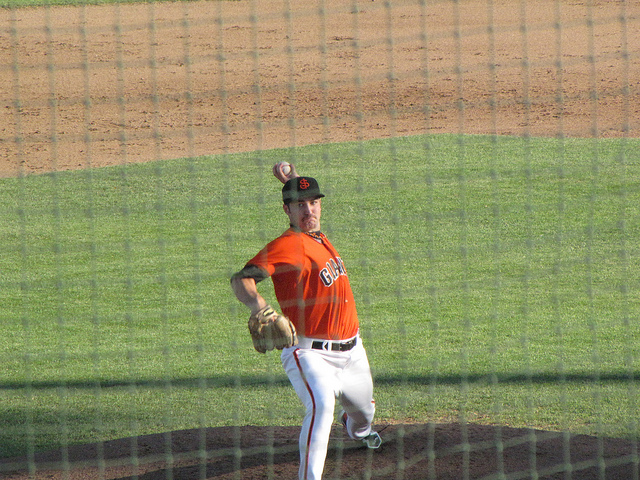

In [78]:
train_dataset[0]["image"]

In [79]:
train_dataset[0]["question"], train_dataset[0]["multiple_choice_answer"]

('What is this photo taken looking through?', 'net')

In [80]:
import pandas as pd
import itertools

answer_space = pd.DataFrame(
    data=pd.concat(
        [
            pd.Series(
                train_dataset["multiple_choice_answer"],
            ),
            pd.Series(
                val_dataset["multiple_choice_answer"],
            ),
#             pd.Series(
#                 itertools.chain.from_iterable(train_dataset["answers"])
#             ),
#              pd.Series(
#                 itertools.chain.from_iterable(val_dataset["answers"])
#             )
        ]
    ).unique(),
    columns=["answer"]
)

answer_space = answer_space.rename_axis('answer_id')
answer_space

,answer
answer_id,
0,net
1,pitcher
2,orange
3,yes
4,white
...,...
29327,8231
29328,3.65
29329,baby monkey


In [81]:
len(answer_space)

29332

In [89]:
def answer_to_id(answer: str) -> int:
    return answer_space[answer_space["answer"] == answer].index

In [90]:
def id_to_answer(id_: int) -> str:
    return answer_space.iloc[id_].answer

In [91]:
answer_to_id("no")

Int64Index([11], dtype='int64', name='answer_id')

In [92]:
id_to_answer(2)

'orange'

In [93]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [94]:
from transformers import AutoTokenizer, AutoImageProcessor, AutoModel

tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
text_encoder = AutoModel.from_pretrained("bert-base-uncased")
for p in text_encoder.parameters():
    p.requires_grad = False


image_processor = AutoImageProcessor.from_pretrained("google/vit-base-patch16-224-in21k")
image_encoder = AutoModel.from_pretrained("google/vit-base-patch16-224-in21k")


for p in image_encoder.parameters():
    p.requires_grad = False


image_encoder.to(device), text_encoder.to(device)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


(ViTModel(
   (embeddings): ViTEmbeddings(
     (patch_embeddings): ViTPatchEmbeddings(
       (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
     )
     (dropout): Dropout(p=0.0, inplace=False)
   )
   (encoder): ViTEncoder(
     (layer): ModuleList(
       (0): ViTLayer(
         (attention): ViTAttention(
           (attention): ViTSelfAttention(
             (query): Linear(in_features=768, out_features=768, bias=True)
             (key): Linear(in_features=768, out_features=768, bias=True)
             (value): Linear(in_features=768, out_features=768, bias=True)
             (dropout): Dropout(p=0.0, inplace=False)
           )
           (output): ViTSelfOutput(
             (dense): Linear(in_features=768, out_features=768, bias=True)
             (dropout): Dropout(p=0.0, inplace=False)
           )
         )
         (intermediate): ViTIntermediate(
           (dense): Linear(in_features=768, out_features=3072, bias=True)
           (intermediate_act_fn)

In [95]:
image_processor

ViTImageProcessor {
  "do_normalize": true,
  "do_rescale": true,
  "do_resize": true,
  "image_mean": [
    0.5,
    0.5,
    0.5
  ],
  "image_processor_type": "ViTImageProcessor",
  "image_std": [
    0.5,
    0.5,
    0.5
  ],
  "resample": 2,
  "rescale_factor": 0.00392156862745098,
  "size": {
    "height": 224,
    "width": 224
  }
}

In [96]:
tokenizer

BertTokenizerFast(name_or_path='bert-base-uncased', vocab_size=30522, model_max_length=512, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'unk_token': '[UNK]', 'sep_token': '[SEP]', 'pad_token': '[PAD]', 'cls_token': '[CLS]', 'mask_token': '[MASK]'})

In [97]:
import torchvision.transforms.functional as TF
import random

def image_transforms(image):
    angles=[-30, -15, 0, 15, 30]
    angle = random.choice(angles)
    image = TF.rotate(image, angle)
    return image

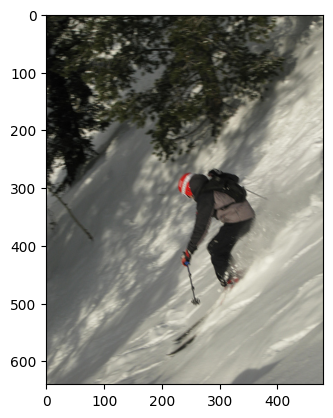

In [98]:
import matplotlib.pyplot as plt

plt.imshow(image_transforms(train_dataset[6]["image"]))

In [99]:
import torch.nn.functional as F

def preprocess_dataset(examples):
    inputs = {}
    inputs["answer_label"] = torch.tensor(
        [
            answer_to_id(answer)
            for answer 
            in examples["multiple_choice_answer"]
        ], 
        dtype=torch.int64
    )
    inputs |= tokenizer(
        text=examples["question"],
        padding='max_length',
        truncation=True,
        return_tensors="pt",
        return_token_type_ids=True,
        return_attention_mask=True,
    )
#     inputs["answers_labels"] = [
#         F.pad(
#             torch.tensor(
#                 [
#                     answer_to_id(answer)
#                     for answer 
#                     in answers
#                 ],
#                 dtype=torch.int64
#             ),
#             (20 - len(answers), 20 - len(answers)),
#             "constant",
#             -1
#         )
#         for answers in examples["answers"]
#     ]
    return inputs

In [100]:
train_dataset_preprocessed = train_dataset.map(preprocess_dataset, batched=True)
train_dataset_preprocessed

Loading cached processed dataset at /.local/share/HuggingFaceM4___vq_av2/default/1.0.0/e4d008385143be7a6bd81e99483e671d5096942bcb987542217121a5ac2cb420/cache-3364a0ab78eafc15.arrow


Dataset({
    features: ['question_type', 'multiple_choice_answer', 'answers', 'image_id', 'answer_type', 'question_id', 'question', 'image', 'answer_label', 'input_ids', 'token_type_ids', 'attention_mask'],
    num_rows: 443757
})

In [101]:
# train_dataset_preprocessed.set_format(
#     type="torch", 
#     columns=[
#         "input_ids",
#         "token_type_ids",
#         "attention_mask",
#         "answer_label",
#         "pixel_values",
#         "answers_labels"
#     ]
# )

In [102]:
def train_transforms(examples):
    examples |= image_processor(
        images=[image_transforms(image.convert('RGB')) for image in examples["image"]],
        return_tensors="pt",
    )
    return examples

In [103]:
train_dataset_preprocessed.set_transform(train_transforms)

In [104]:
train_dataset_preprocessed[:1]["pixel_values"]

tensor([[[[ 0.1529,  0.1608,  0.1294,  ...,  0.4667,  0.4745,  0.4431],
          [ 0.1059,  0.1765,  0.1451,  ...,  0.4353,  0.3961,  0.3804],
          [ 0.0118,  0.0510,  0.0667,  ...,  0.4588,  0.4118,  0.4196],
          ...,
          [-0.4980, -0.5529, -0.5451,  ..., -0.5294, -0.4588, -0.5294],
          [-0.4196, -0.4745, -0.4196,  ..., -0.5529, -0.4745, -0.4980],
          [-0.3647, -0.3412, -0.2941,  ..., -0.5451, -0.4745, -0.5137]],

         [[ 0.3020,  0.2941,  0.2627,  ...,  0.2000,  0.2000,  0.1843],
          [ 0.2392,  0.2863,  0.2235,  ...,  0.1843,  0.1294,  0.0980],
          [ 0.0588,  0.1137,  0.0902,  ...,  0.1922,  0.1451,  0.1294],
          ...,
          [-0.5451, -0.5608, -0.5686,  ..., -0.5294, -0.4353, -0.5216],
          [-0.4824, -0.5216, -0.4824,  ..., -0.5373, -0.4431, -0.4980],
          [-0.4275, -0.4510, -0.4353,  ..., -0.5294, -0.4353, -0.5059]],

         [[-0.1843, -0.1765, -0.2078,  ..., -0.0667, -0.0510, -0.0667],
          [-0.2235, -0.1765, -

In [105]:
# train_dataset_preprocessed[:1]['answers_labels']

In [106]:
val_dataset_preprocessed = val_dataset.map(preprocess_dataset, batched=True)
val_dataset_preprocessed

Map:   0%|          | 0/214354 [00:00<?, ? examples/s]

Dataset({
    features: ['question_type', 'multiple_choice_answer', 'answers', 'image_id', 'answer_type', 'question_id', 'question', 'image', 'answer_label', 'input_ids', 'token_type_ids', 'attention_mask'],
    num_rows: 214354
})

In [107]:
# val_dataset_preprocessed.set_format(
#     type="torch", 
#     columns=[
#         "input_ids",
#         "token_type_ids",
#         "attention_mask",
#         "pixel_values",
#         "answer_label",
#         "answers_labels"
#     ]
# )

In [108]:
def val_transforms(examples):
    examples |= image_processor(
        images=[image.convert('RGB') for image in examples["image"]],
        return_tensors="pt",
    )
    return examples

In [109]:
val_dataset_preprocessed.set_transform(val_transforms)

In [110]:
from torch.utils.data import DataLoader, RandomSampler, SequentialSampler
import numpy as np

batch_size = 64

def collate_fn(examples):
    input_ids = []
    token_type_ids = []
    attention_mask = []
    pixel_values = []
    answer_label = []
#     answers_label = []
    for example in examples:
        input_ids.append(torch.tensor(example["input_ids"]))
        token_type_ids.append(torch.tensor(example["token_type_ids"]))
        attention_mask.append(torch.tensor(example["attention_mask"]))
        pixel_values.append(example["pixel_values"])
        answer_label.append(torch.tensor(example["answer_label"]))
#         ans = np.asarray(example["answers_labels"])
#         ans = ans[ans != -1]
#         ans = np.random.choice(ans)
#         answers_label.append(torch.tensor([ans]))
    return {
        "input_ids": torch.stack(input_ids),
        "token_type_ids": torch.stack(token_type_ids),
        "attention_mask": torch.stack(attention_mask),
        "pixel_values": torch.stack(pixel_values),
        "answer_label": torch.tensor(answer_label).squeeze(),
#         "answers_label": torch.tensor(answers_label).squeeze()
    }

dataloader_train = DataLoader(
    train_dataset_preprocessed,
    sampler=RandomSampler(train_dataset_preprocessed),
    collate_fn=collate_fn,
    batch_size=batch_size
)

dataloader_validation = DataLoader(
    val_dataset_preprocessed, 
    sampler=SequentialSampler(val_dataset_preprocessed),
    collate_fn=collate_fn,
    batch_size=batch_size
)

In [111]:
image_encoder_output = image_encoder(train_dataset_preprocessed[:1]["pixel_values"].to(device))
# The last hidden layer output , # The classification token
image_encoder_output.last_hidden_state.shape, image_encoder_output.pooler_output.shape 

(torch.Size([1, 197, 768]), torch.Size([1, 768]))

In [112]:
text_encoder_output = text_encoder(
    input_ids=torch.tensor(train_dataset_preprocessed[:1]["input_ids"]).to(device),
    token_type_ids=torch.tensor(train_dataset_preprocessed[:1]["token_type_ids"]).to(device),
    attention_mask=torch.tensor(train_dataset_preprocessed[:1]["attention_mask"]).to(device),
)
# The last hidden layer output, # The classification token
text_encoder_output.last_hidden_state.shape, text_encoder_output.pooler_output.shape

(torch.Size([1, 512, 768]), torch.Size([1, 768]))

In [113]:
from torch import nn
import math

class Fusion(nn.Module):

    def __init__(self, answers_num: int):
        super().__init__()        
        self.vision_projection = nn.Sequential(
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.LayerNorm(768),
            nn.Dropout(0.3),
        )
        self.text_projection = nn.Sequential(
            nn.Linear(768, 768),
            nn.ReLU(),
            nn.LayerNorm(768),
            nn.Dropout(0.3),
        )
        self.fusion = nn.Sequential(
            nn.Linear(768 * 2, 768, bias=False),
            nn.ReLU(),
            nn.BatchNorm1d(768),
            nn.Dropout(0.3),
        )
        self.classifier = nn.Sequential(
            nn.Linear(768, 512),
            nn.ReLU(),
            nn.BatchNorm1d(512),
            nn.Dropout(0.3),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.BatchNorm1d(256),
            nn.Dropout(0.3),
            nn.Linear(256, answers_num) 
        )
        
    def forward(self, image_emb, text_emb):
        return self.classifier(
            self.fusion(
                torch.cat([self.vision_projection(image_emb), self.text_projection(text_emb)], dim=1)
            )
        )


In [114]:
model = Fusion(len(answer_space)).to(device)

In [115]:
from typing import Tuple, Dict
import numpy as np
from sklearn.metrics import accuracy_score, f1_score

def compute_metrics(eval_tuple: Tuple[np.ndarray, np.ndarray]) -> Dict[str, float]:
    preds, labels = eval_tuple
    return {
        "acc": accuracy_score(labels, preds),
        "f1": f1_score(labels, preds, average='macro')
    }

In [116]:
def train_one_epoch(loss_fn, optimizer):
    running_loss = 0.
    last_loss = 0.
    
    for i, data in enumerate(dataloader_train):
        
        image_encoder_output = image_encoder(
            data["pixel_values"].to(device)
        )
        text_encoder_output = text_encoder(
            input_ids=data["input_ids"].to(device),
            token_type_ids=data["token_type_ids"].to(device),
            attention_mask=data["attention_mask"].to(device),
        )
        
#         if random.random() > 0.5:
#             labels = data["answer_label"].to(device)
#         else:
#             labels = data["answers_label"].to(device)

        labels = data["answer_label"].to(device)


        optimizer.zero_grad()

        outputs = model(
            image_encoder_output.pooler_output.detach(),
            text_encoder_output.pooler_output.detach()
        )

        loss = loss_fn(outputs, labels)
        loss.backward()

        optimizer.step()

        running_loss += loss.item() / len(labels)
        if (i + 1) % 10 == 0:
            last_loss = running_loss / 10
            print('  batch {} loss: {}'.format(i + 1, last_loss))
            running_loss = 0.

    return last_loss

In [117]:
import torch.optim as optim

EPOCHS = 10
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.005)

for epoch in range(EPOCHS):
    print('EPOCH {}:'.format(epoch + 1))

    model.train()
    
    avg_loss = train_one_epoch(loss_fn, optimizer)

    model.eval()
    
    with torch.no_grad():
        val_running_loss = 0.0
        val_labels = torch.LongTensor([]).to(device)
        val_preds = torch.DoubleTensor([]).to(device)
        for i, val_data in enumerate(dataloader_validation):
            image_encoder_output = image_encoder(
                val_data["pixel_values"].to(device)
            )
            text_encoder_output = text_encoder(
                input_ids=val_data["input_ids"].to(device),
                token_type_ids=val_data["token_type_ids"].to(device),
                attention_mask=val_data["attention_mask"].to(device),
            )
            labels = val_data["answer_label"].to(device)
            logits = model(
                image_encoder_output.pooler_output,
                text_encoder_output.pooler_output
            )
            _, preds = logits.max(-1)
            val_preds = torch.cat([val_preds, preds])
            val_labels = torch.cat([val_labels, labels])
            val_loss = loss_fn(logits, labels)
            val_running_loss += val_loss / len(labels)

        val_metrics = compute_metrics(
            (
                val_preds.detach().cpu().numpy(),
                val_labels.detach().cpu().numpy()
            )
        )
        avg_val_loss = val_running_loss / (i + 1)
        print('LOSS train {} valid {}'.format(avg_loss, avg_val_loss))
        print(f'Validation accuracy: {val_metrics["acc"]}; Validation f1-score: {val_metrics["f1"]}')

EPOCH 1:
  batch 10 loss: 0.15959170162677766
  batch 20 loss: 0.14456796944141387
  batch 30 loss: 0.12930048927664756
  batch 40 loss: 0.11736614629626274
  batch 50 loss: 0.10407172590494156
  batch 60 loss: 0.09598257243633271
  batch 70 loss: 0.09367760494351388
  batch 80 loss: 0.08795194700360298
  batch 90 loss: 0.08982425555586815
  batch 100 loss: 0.08785199150443077
  batch 110 loss: 0.09037542939186097
  batch 120 loss: 0.08550874665379524
  batch 130 loss: 0.08695886433124542
  batch 140 loss: 0.08440257236361504
  batch 150 loss: 0.08758256062865258
  batch 160 loss: 0.08583523109555244
  batch 170 loss: 0.0808118648827076
  batch 180 loss: 0.08627373352646828
  batch 190 loss: 0.08415795415639878
  batch 200 loss: 0.08185562044382096
  batch 210 loss: 0.08265050500631332
  batch 220 loss: 0.07710212767124176
  batch 230 loss: 0.08239770829677581
  batch 240 loss: 0.08019860312342644
  batch 250 loss: 0.0796594500541687
  batch 260 loss: 0.0807931363582611
  batch 270 los

  batch 2150 loss: 0.06644464507699013
  batch 2160 loss: 0.06709214001893997
  batch 2170 loss: 0.06727397181093693
  batch 2180 loss: 0.06421525478363037
  batch 2190 loss: 0.06433424912393093
  batch 2200 loss: 0.06056471914052963
  batch 2210 loss: 0.06912853866815567
  batch 2220 loss: 0.06502270735800267
  batch 2230 loss: 0.06531517542898654
  batch 2240 loss: 0.06798797771334648
  batch 2250 loss: 0.06324114985764026
  batch 2260 loss: 0.06644339039921761
  batch 2270 loss: 0.06559098772704601
  batch 2280 loss: 0.06531693637371064
  batch 2290 loss: 0.0668991569429636
  batch 2300 loss: 0.06745473146438599
  batch 2310 loss: 0.06403418295085431
  batch 2320 loss: 0.06890494041144848
  batch 2330 loss: 0.0588285181671381
  batch 2340 loss: 0.0670246098190546
  batch 2350 loss: 0.062242680415511134
  batch 2360 loss: 0.06444906853139401
  batch 2370 loss: 0.06403156518936157
  batch 2380 loss: 0.06371678821742535
  batch 2390 loss: 0.06398960426449776
  batch 2400 loss: 0.063799

  batch 4260 loss: 0.0631735634058714
  batch 4270 loss: 0.06190099976956844
  batch 4280 loss: 0.061416369304060935
  batch 4290 loss: 0.06165597029030323
  batch 4300 loss: 0.06303347498178483
  batch 4310 loss: 0.0640482060611248
  batch 4320 loss: 0.060571393370628356
  batch 4330 loss: 0.06088976301252842
  batch 4340 loss: 0.06385787464678287
  batch 4350 loss: 0.06115444302558899
  batch 4360 loss: 0.05993385501205921
  batch 4370 loss: 0.059779754281044005
  batch 4380 loss: 0.06194270849227905
  batch 4390 loss: 0.06073164641857147
  batch 4400 loss: 0.05920656733214855
  batch 4410 loss: 0.05965532436966896
  batch 4420 loss: 0.06043882109224796
  batch 4430 loss: 0.06217881329357624
  batch 4440 loss: 0.05995662994682789
  batch 4450 loss: 0.06067190319299698
  batch 4460 loss: 0.05955589450895786
  batch 4470 loss: 0.06326825208961964
  batch 4480 loss: 0.06043475456535816
  batch 4490 loss: 0.06016461364924908
  batch 4500 loss: 0.0600842896848917
  batch 4510 loss: 0.0654

  batch 6360 loss: 0.059339926764369014
  batch 6370 loss: 0.06073731370270252
  batch 6380 loss: 0.06287174299359322
  batch 6390 loss: 0.06023497097194195
  batch 6400 loss: 0.06494848281145096
  batch 6410 loss: 0.0625054281204939
  batch 6420 loss: 0.061335135251283646
  batch 6430 loss: 0.06188746429979801
  batch 6440 loss: 0.06880934201180935
  batch 6450 loss: 0.06319273300468922
  batch 6460 loss: 0.05854694284498692
  batch 6470 loss: 0.06033107750117779
  batch 6480 loss: 0.0622423630207777
  batch 6490 loss: 0.06021944209933281
  batch 6500 loss: 0.05723017416894436
  batch 6510 loss: 0.06372556164860725
  batch 6520 loss: 0.06197742260992527
  batch 6530 loss: 0.0673514373600483
  batch 6540 loss: 0.060119859501719476
  batch 6550 loss: 0.06559816002845764
  batch 6560 loss: 0.06512615121901036
  batch 6570 loss: 0.06916334070265293
  batch 6580 loss: 0.06739985086023807
  batch 6590 loss: 0.06683560982346534
  batch 6600 loss: 0.06316525042057038
  batch 6610 loss: 0.0676

  batch 1510 loss: 0.056624391674995424
  batch 1520 loss: 0.058608490973711014
  batch 1530 loss: 0.05936032347381115
  batch 1540 loss: 0.06138620711863041
  batch 1550 loss: 0.05634122826159001
  batch 1560 loss: 0.059182214364409444
  batch 1570 loss: 0.06054767444729805
  batch 1580 loss: 0.061708231642842296
  batch 1590 loss: 0.059991104528307915
  batch 1600 loss: 0.05643512941896915
  batch 1610 loss: 0.05683997012674809
  batch 1620 loss: 0.059685702249407765
  batch 1630 loss: 0.059312961623072626
  batch 1640 loss: 0.05915540903806686
  batch 1650 loss: 0.05936603881418705
  batch 1660 loss: 0.05982904806733132
  batch 1670 loss: 0.05819249041378498
  batch 1680 loss: 0.05755331628024578
  batch 1690 loss: 0.06071264073252678
  batch 1700 loss: 0.05897512063384056
  batch 1710 loss: 0.06464446820318699
  batch 1720 loss: 0.058502663299441336
  batch 1730 loss: 0.05986831896007061
  batch 1740 loss: 0.06035217791795731
  batch 1750 loss: 0.060206085443496704
  batch 1760 los

  batch 3600 loss: 0.062243183329701426
  batch 3610 loss: 0.05991382524371147
  batch 3620 loss: 0.05679813176393509
  batch 3630 loss: 0.06864756867289543
  batch 3640 loss: 0.05685579814016819
  batch 3650 loss: 0.06322571374475956
  batch 3660 loss: 0.0644200824201107
  batch 3670 loss: 0.058240189030766484
  batch 3680 loss: 0.05929466001689434
  batch 3690 loss: 0.05897737704217434
  batch 3700 loss: 0.06036607511341572
  batch 3710 loss: 0.05920243933796883
  batch 3720 loss: 0.061082792654633525
  batch 3730 loss: 0.057441971451044085
  batch 3740 loss: 0.06128500588238239
  batch 3750 loss: 0.057223211601376535
  batch 3760 loss: 0.059319252893328664
  batch 3770 loss: 0.056621546298265456
  batch 3780 loss: 0.05768883377313614
  batch 3790 loss: 0.05754710473120213
  batch 3800 loss: 0.05828678235411644
  batch 3810 loss: 0.059538496658205986
  batch 3820 loss: 0.05784469246864319
  batch 3830 loss: 0.05757584311068058
  batch 3840 loss: 0.06026010252535343
  batch 3850 loss:

  batch 5690 loss: 0.060309945791959765
  batch 5700 loss: 0.05903379842638969
  batch 5710 loss: 0.05936090871691704
  batch 5720 loss: 0.06059660762548447
  batch 5730 loss: 0.05694367364048958
  batch 5740 loss: 0.05915994606912136
  batch 5750 loss: 0.05788697674870491
  batch 5760 loss: 0.061356667801737784
  batch 5770 loss: 0.053469381853938104
  batch 5780 loss: 0.05622156336903572
  batch 5790 loss: 0.058064255863428116
  batch 5800 loss: 0.05847789905965328
  batch 5810 loss: 0.05898052155971527
  batch 5820 loss: 0.06306679397821427
  batch 5830 loss: 0.05904597193002701
  batch 5840 loss: 0.05952774435281753
  batch 5850 loss: 0.057051359117031096
  batch 5860 loss: 0.058188742771744725
  batch 5870 loss: 0.060542674735188484
  batch 5880 loss: 0.05674239136278629
  batch 5890 loss: 0.058210679516196254
  batch 5900 loss: 0.060932394862174985
  batch 5910 loss: 0.05387059710919857
  batch 5920 loss: 0.05711294636130333
  batch 5930 loss: 0.06135677397251129
  batch 5940 los

KeyboardInterrupt: 

In [118]:
import random 
random_eval_examples = random.choices(val_dataset_preprocessed, k=20)

In [119]:
random_eval_examples

[{'question_type': 'how many',
  'multiple_choice_answer': '2',
  'answers': [{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 1},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 2},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 3},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 4},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 5},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 6},
   {'answer': 'prick', 'answer_confidence': 'maybe', 'answer_id': 7},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 8},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 9},
   {'answer': '2', 'answer_confidence': 'yes', 'answer_id': 10}],
  'image_id': 211119,
  'answer_type': 'number',
  'question_id': 211119000,
  'question': 'How many people sitting around?',
  'image': <PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x425>,
  'answer_label': [20],
  'input_ids': [101,
   2129,
   2116,
   2111,
   

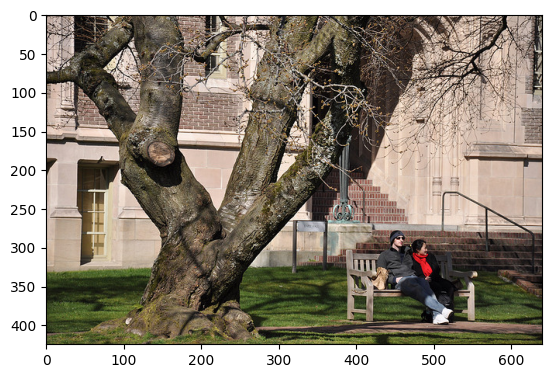

Question: How many people sitting around?
Answer: 2
Possible alternative answers:
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'prick', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
15    1
Name: answer, dtype: object


/tmp/ipykernel_683396/337547468.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  torch.tensor(eval_data_point["pixel_values"]).unsqueeze(0).to(device)


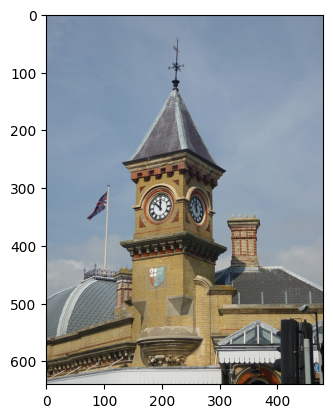

Question: What style of architecture does the church portray?
Answer: victorian
Possible alternative answers:
	{'answer': 'renaissance', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'bell tower', 'answer_confidence': 'maybe', 'answer_id': 2}
	{'answer': 'european', 'answer_confidence': 'no', 'answer_id': 3}
	{'answer': 'medieval', 'answer_confidence': 'maybe', 'answer_id': 4}
	{'answer': 'roman', 'answer_confidence': 'no', 'answer_id': 5}
	{'answer': 'victorian', 'answer_confidence': 'maybe', 'answer_id': 6}
	{'answer': 'victorian', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': 'romantic', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': 'gothic', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'old', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
97    wood
Name: answer, dtype: object


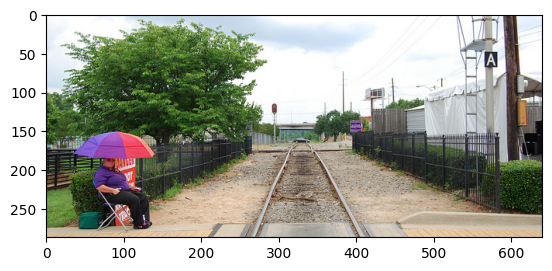

Question: What kind of trees are in the picture?
Answer: oak
Possible alternative answers:
	{'answer': 'maple', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'maple', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'ash', 'answer_confidence': 'no', 'answer_id': 3}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 4}
	{'answer': 'unknown', 'answer_confidence': 'maybe', 'answer_id': 5}
	{'answer': 'maple', 'answer_confidence': 'no', 'answer_id': 6}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': 'oak', 'answer_confidence': 'no', 'answer_id': 9}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 10}
Model answers:
 answer_id
700    train
Name: answer, dtype: object


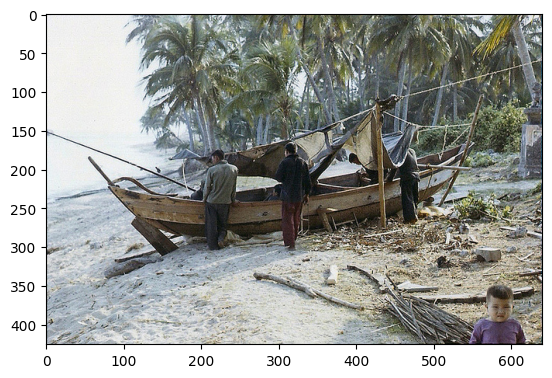

Question: How much water is under the boat?
Answer: 0
Possible alternative answers:
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': '2 ft', 'answer_confidence': 'maybe', 'answer_id': 3}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'little', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': '0', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
453    surfing
Name: answer, dtype: object


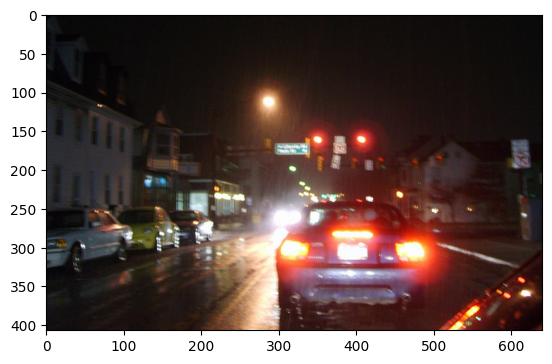

Question: How many cars are in this scene?
Answer: 4
Possible alternative answers:
	{'answer': '4', 'answer_confidence': 'maybe', 'answer_id': 1}
	{'answer': '4', 'answer_confidence': 'maybe', 'answer_id': 2}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '5', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '5', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': '8', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': '5', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
20    2
Name: answer, dtype: object


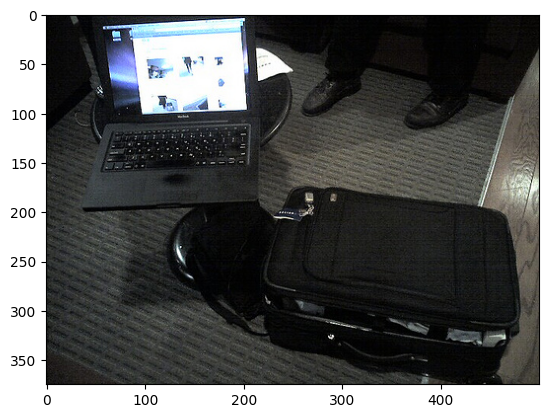

Question: What print is on the rug?
Answer: none
Possible alternative answers:
	{'answer': 'stripe', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'stripe', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'square', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'rectangle', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'none', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'none', 'answer_confidence': 'no', 'answer_id': 6}
	{'answer': 'rectangles', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'checkered', 'answer_confidence': 'no', 'answer_id': 8}
	{'answer': 'english', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'rectangles', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
297    phone
Name: answer, dtype: object


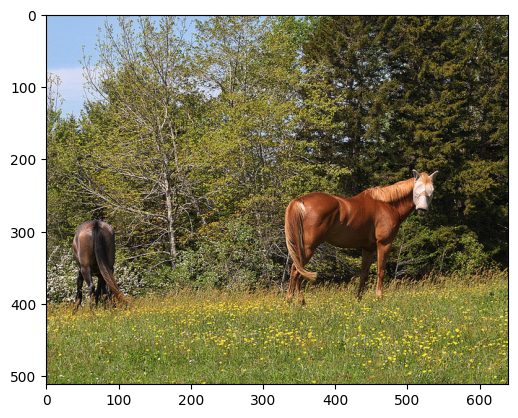

Question: Is the horse wearing a lead rope?
Answer: no
Possible alternative answers:
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
3    yes
Name: answer, dtype: object


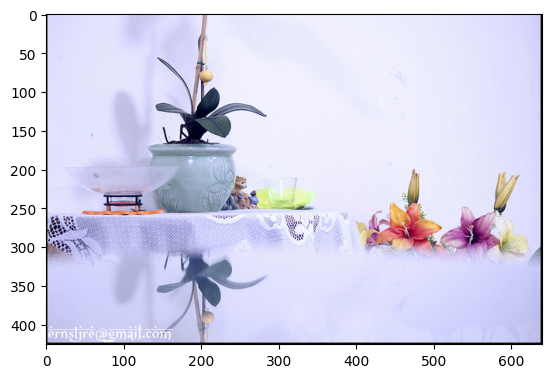

Question: What kind of flower do you see?
Answer: lily
Possible alternative answers:
	{'answer': 'rose', 'answer_confidence': 'no', 'answer_id': 1}
	{'answer': 'fake', 'answer_confidence': 'maybe', 'answer_id': 2}
	{'answer': 'pretty', 'answer_confidence': 'no', 'answer_id': 3}
	{'answer': 'orchid', 'answer_confidence': 'no', 'answer_id': 4}
	{'answer': 'lily', 'answer_confidence': 'maybe', 'answer_id': 5}
	{'answer': 'lily', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'lilies', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'orchid', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': 'lily', 'answer_confidence': 'maybe', 'answer_id': 9}
	{'answer': 'tulip', 'answer_confidence': 'no', 'answer_id': 10}
Model answers:
 answer_id
59    cake
Name: answer, dtype: object


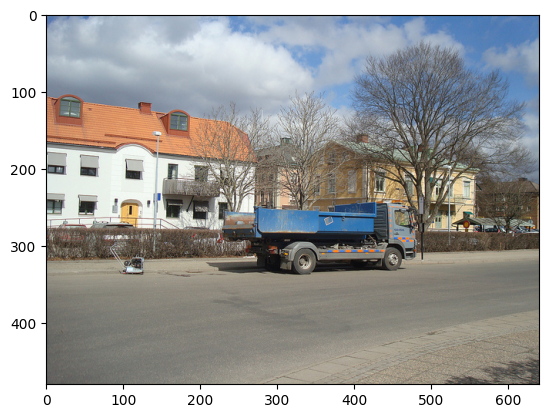

Question: What kind of tree is in the background?
Answer: oak
Possible alternative answers:
	{'answer': 'elm', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'bare', 'answer_confidence': 'maybe', 'answer_id': 2}
	{'answer': 'common', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'pine', 'answer_confidence': 'maybe', 'answer_id': 4}
	{'answer': 'maple', 'answer_confidence': 'maybe', 'answer_id': 5}
	{'answer': 'oak', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'tall tree', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': 'oak', 'answer_confidence': 'maybe', 'answer_id': 9}
	{'answer': 'elm', 'answer_confidence': 'maybe', 'answer_id': 10}
Model answers:
 answer_id
6    red
Name: answer, dtype: object


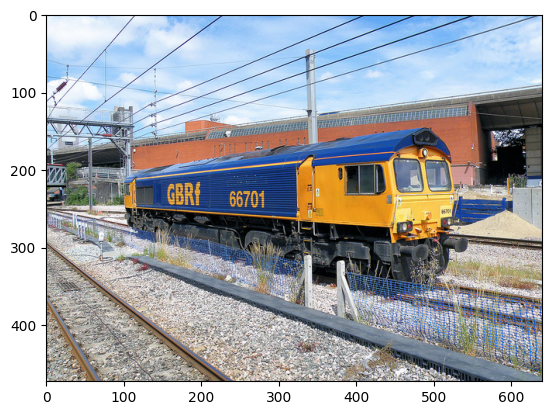

Question: How many sets of tracks are visible in this scene?
Answer: 3
Possible alternative answers:
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': '2', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': '3', 'answer_confidence': 'maybe', 'answer_id': 8}
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': '3', 'answer_confidence': 'maybe', 'answer_id': 10}
Model answers:
 answer_id
15    1
Name: answer, dtype: object


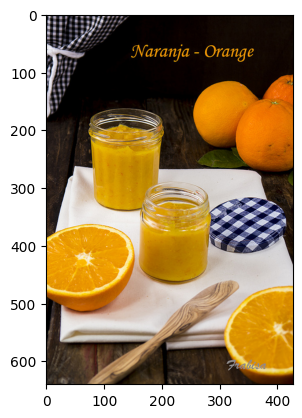

Question: What fruit is shown sliced in half?
Answer: orange
Possible alternative answers:
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'yes', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'orange', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
1091    apples
Name: answer, dtype: object


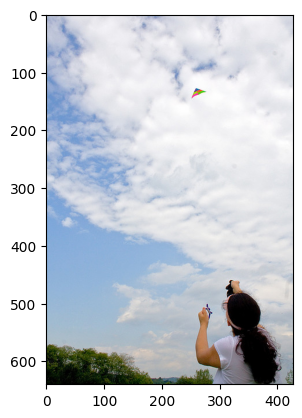

Question: How many women in the picture?
Answer: 1
Possible alternative answers:
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': '1', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
15    1
Name: answer, dtype: object


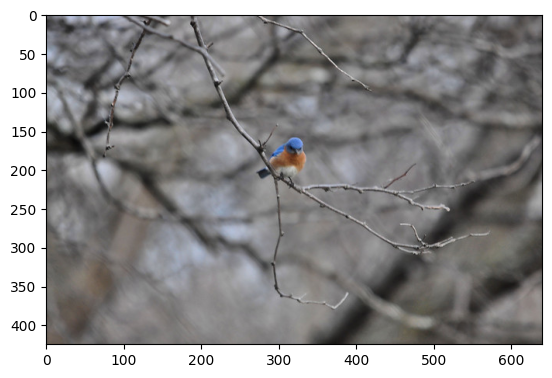

Question: Is the whole photo in focus?
Answer: no
Possible alternative answers:
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
3    yes
Name: answer, dtype: object


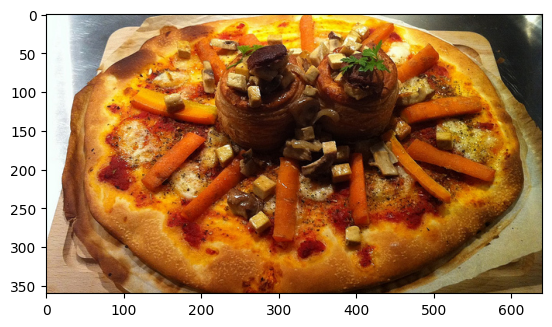

Question: Is this pizza's crust burnt?
Answer: no
Possible alternative answers:
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 5}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
3    yes
Name: answer, dtype: object


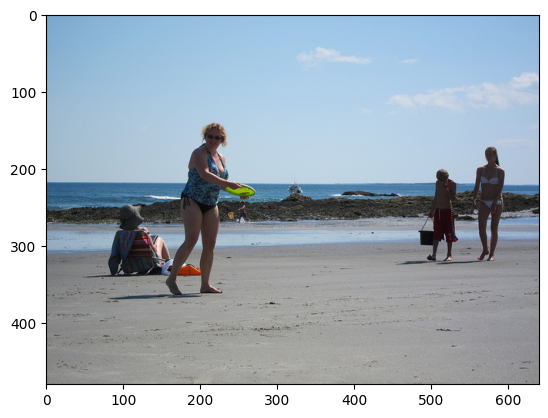

Question: Are they on a private island?
Answer: no
Possible alternative answers:
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 2}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 4}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'no', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': 'no', 'answer_confidence': 'no', 'answer_id': 8}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'no', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
3    yes
Name: answer, dtype: object


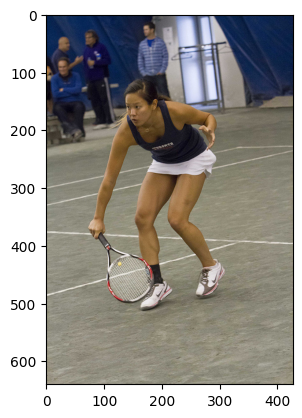

Question: What color is the girl's outfit?
Answer: blue and white
Possible alternative answers:
	{'answer': 'blue/white', 'answer_confidence': 'maybe', 'answer_id': 1}
	{'answer': 'black tank top, white skirt, white shoes', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'blue and white', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'black and white', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'blue and white', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'black and white', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'white', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'blue and white', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'black and white', 'answer_confidence': 'maybe', 'answer_id': 10}
Model answers:
 answer_id
4    white
Name: answer, dtype: object


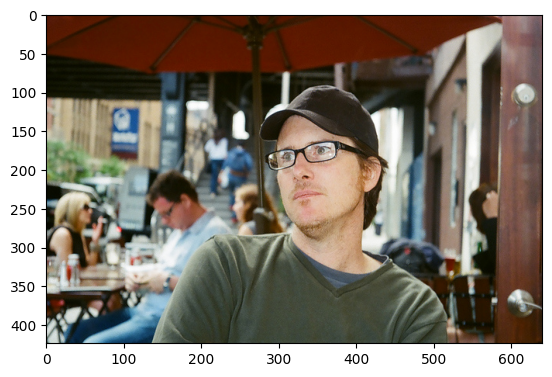

Question: What color is the man in the foreground's hat?
Answer: black
Possible alternative answers:
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'brown', 'answer_confidence': 'maybe', 'answer_id': 3}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'black', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
16    blue
Name: answer, dtype: object


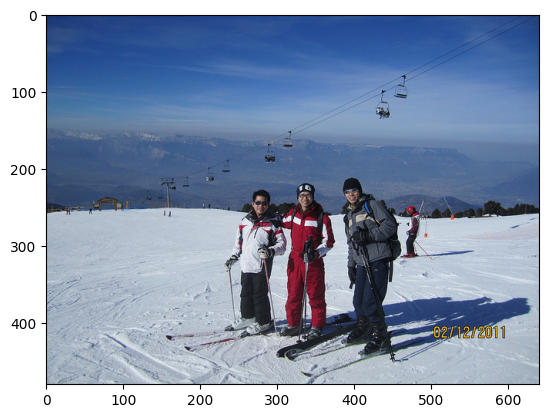

Question: How many people are pictured?
Answer: 4
Possible alternative answers:
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': '3', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': '3', 'answer_confidence': 'maybe', 'answer_id': 3}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': '4', 'answer_confidence': 'maybe', 'answer_id': 6}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': '8', 'answer_confidence': 'maybe', 'answer_id': 9}
	{'answer': '4', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
15    1
Name: answer, dtype: object


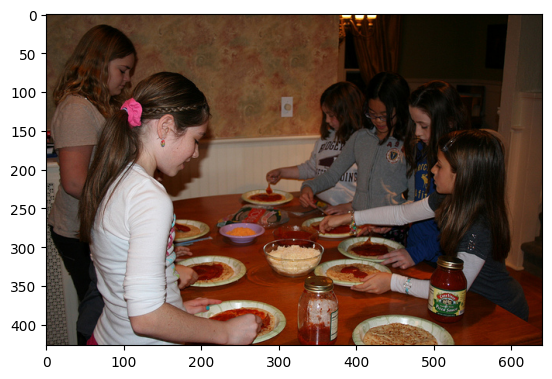

Question: What color hair do most of these girls have?
Answer: brown
Possible alternative answers:
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'brown', 'answer_confidence': 'maybe', 'answer_id': 7}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'brown', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'brunette', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
4    white
Name: answer, dtype: object


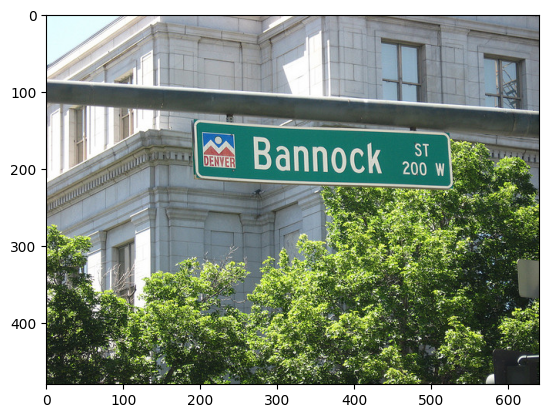

Question: What street is this?
Answer: bannock
Possible alternative answers:
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 1}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 2}
	{'answer': 'bannock st', 'answer_confidence': 'yes', 'answer_id': 3}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 4}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 5}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 6}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 7}
	{'answer': 'bannock st', 'answer_confidence': 'yes', 'answer_id': 8}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 9}
	{'answer': 'bannock', 'answer_confidence': 'yes', 'answer_id': 10}
Model answers:
 answer_id
130    none
Name: answer, dtype: object


In [120]:
import matplotlib.pyplot as plt

model.eval()

for eval_data_point in random_eval_examples:
    plt.figure()
    plt.imshow(eval_data_point["image"])
    plt.show()
    print(f"Question: {eval_data_point['question']}")
    print(f"Answer: {eval_data_point['multiple_choice_answer']}")
    print("Possible alternative answers:")
    for answer in eval_data_point["answers"]:
        print(f"\t{answer}")
    image_encoder_output = image_encoder(
        torch.tensor(eval_data_point["pixel_values"]).unsqueeze(0).to(device)
    )
    text_encoder_output = text_encoder(
        input_ids=torch.tensor(eval_data_point["input_ids"]).unsqueeze(0).to(device),
        token_type_ids=torch.tensor(eval_data_point["token_type_ids"]).unsqueeze(0).to(device),
        attention_mask=torch.tensor(eval_data_point["attention_mask"]).unsqueeze(0).to(device),
    )
    logits = model(
        image_encoder_output.pooler_output,
        text_encoder_output.pooler_output
    )
    preds = logits.argmax(-1).detach().cpu().numpy()
    print(f"Model answers:\n {answer_space.iloc[preds].answer}")